In [1]:
import sys
print( f"Python {sys.version}\n" )

import os

import math

import numpy as np
print( f"NumPy {np.__version__}\n" )

import pandas as pd
print( f"Pandas {pd.__version__}\n" )

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
print( f"Matplotlib {matplotlib.__version__}\n" )

import tensorflow as tf
print( f"TensorFlow {tf.__version__}" )
print( f"tf.keras.backend.image_data_format() = {tf.keras.backend.image_data_format()}" )




# Count the number of GPUs as detected by tensorflow
gpus = tf.config.list_physical_devices('GPU')
print( f"TensorFlow detected { len(gpus) } GPU(s):" )
for i, gpu in enumerate(gpus):
  print( f".... GPU No. {i}: Name = {gpu.name} , Type = {gpu.device_type}" )

Python 3.9.17 (main, Jul  5 2023, 20:47:11) [MSC v.1916 64 bit (AMD64)]

NumPy 1.25.2

Pandas 2.0.3

Matplotlib 3.7.2

TensorFlow 2.10.1
tf.keras.backend.image_data_format() = channels_last
TensorFlow detected 1 GPU(s):
.... GPU No. 0: Name = /physical_device:GPU:0 , Type = GPU


In [2]:
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers.experimental.preprocessing import RandomFlip, RandomRotation, RandomZoom, RandomTranslation, Rescaling
from tensorflow.keras.layers import RandomBrightness
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.losses import SparseCategoricalCrossentropy, CategoricalCrossentropy
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model
from keras.callbacks import History , ModelCheckpoint
from keras import models
from gradcam import get_img_array,make_gradcam_heatmap,save_and_display_gradcam

# Prepare data

In [5]:
#Resize

BATCH_SIZE = 8

IMG_HEIGHT = 224
IMG_WIDTH = 224

epochs = 200

In [6]:
base_dir = 'dataset'

train_dir = os.path.join(base_dir, 'train')
test_dir = os.path.join(base_dir, 'test')

In [7]:
test_dataset = image_dataset_from_directory(test_dir,
                                             shuffle=True,
                                             seed=123,
                                             batch_size=BATCH_SIZE,
                                             label_mode='int',
                                             color_mode='rgb',
                                             image_size=(IMG_HEIGHT, IMG_WIDTH)
                                             )

class_names = test_dataset.class_names
print(class_names)

Found 160 files belonging to 4 classes.
['caribou', 'deer', 'elk', 'moose']


In [9]:
model_path = "model_3_epoch53_loss0.1321_acc0.9583.hdf5"
loaded_model = tf.keras.models.load_model(model_path)
results = loaded_model.evaluate(test_dataset)
print(f'{loaded_model.metrics_names}: {results}')

20/20 [==============================] - 14s 127ms/step - loss: 0.2344 - accuracy: 0.9312
['loss', 'accuracy']: [0.2343745231628418, 0.9312499761581421]


In [10]:
last_conv_layer_name = "conv5_block32_2_conv"

# Deer

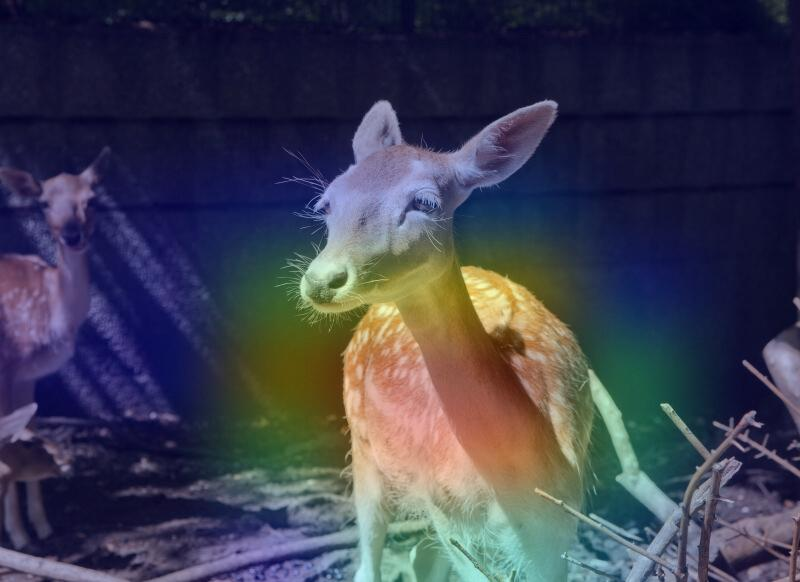

In [13]:
grad_cam_img_path = 'dataset/train/deer/fallow_deer_4.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

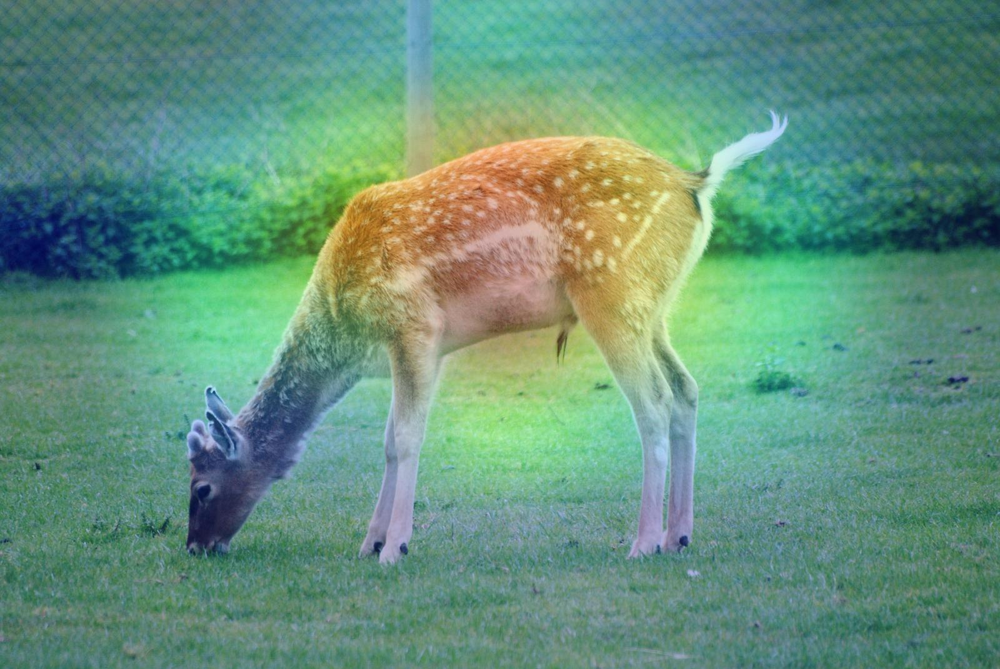

In [15]:
grad_cam_img_path = 'dataset/train/deer/fallow_deer_14.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

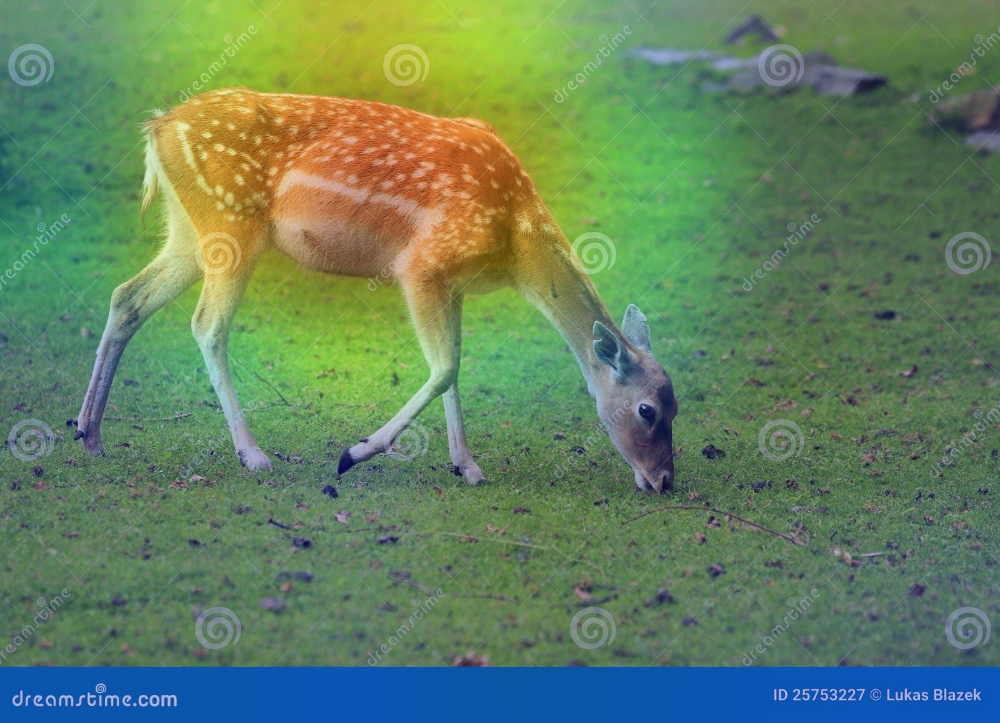

In [26]:
grad_cam_img_path = 'dataset/train/deer/fallow_deer_16.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

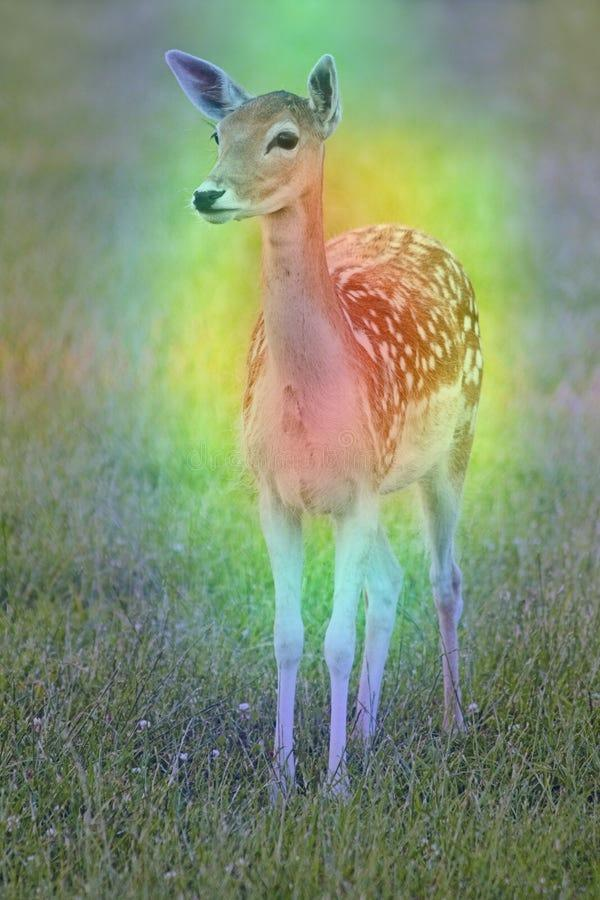

In [25]:
grad_cam_img_path = 'dataset/train/deer/fallow_deer_24.jpg' 
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

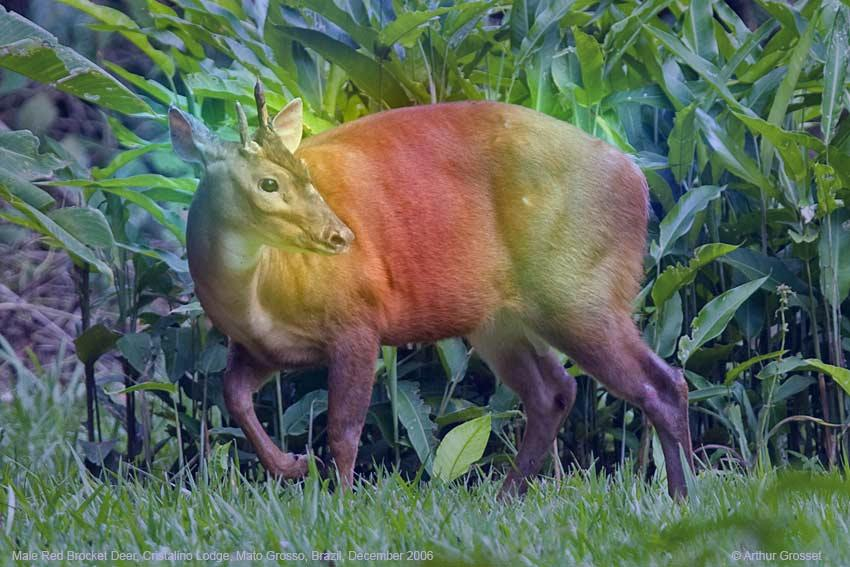

In [29]:
grad_cam_img_path = 'dataset/train/deer/american_red_brocket_3.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

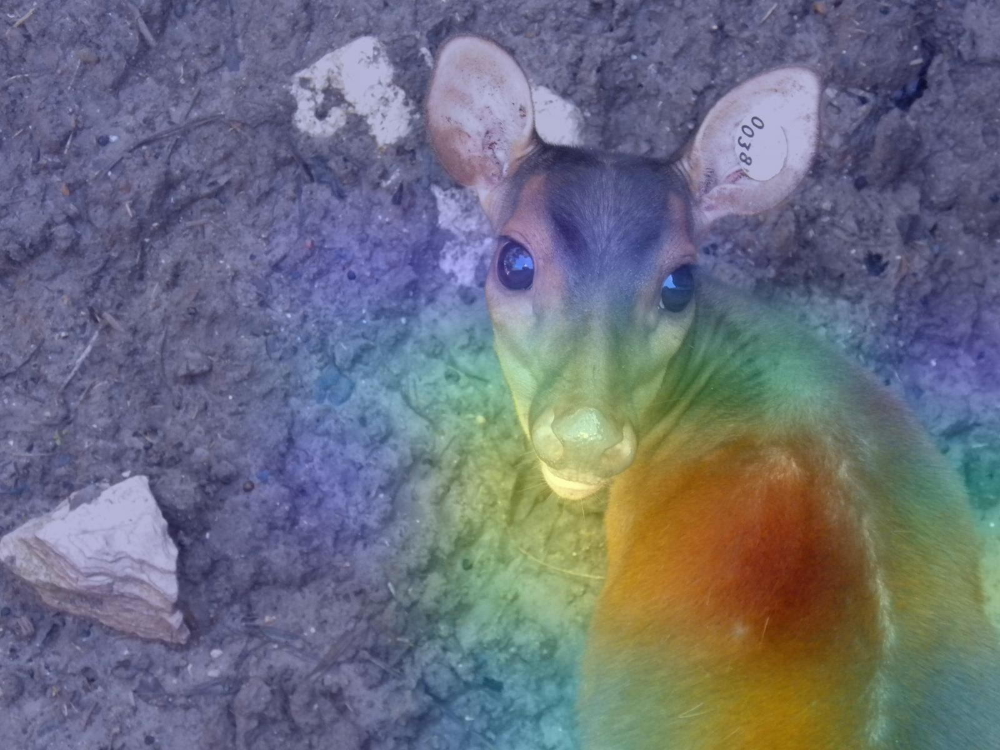

In [30]:
grad_cam_img_path = 'dataset/train/deer/american_red_brocket_9.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

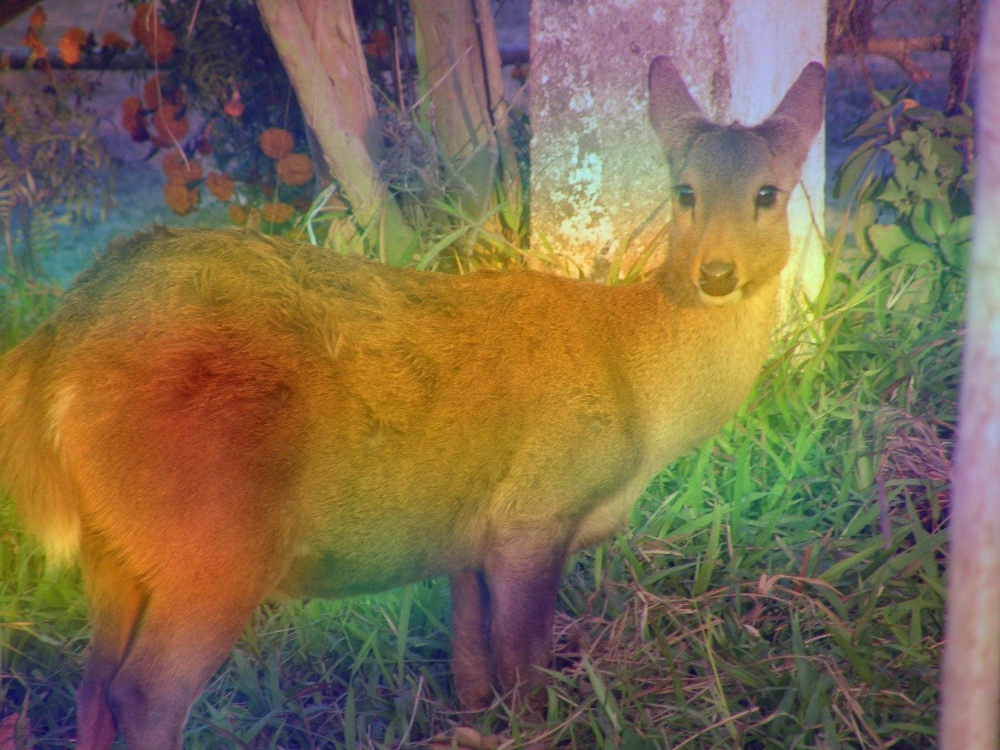

In [31]:
grad_cam_img_path = 'dataset/train/deer/indian_hog_deer2.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

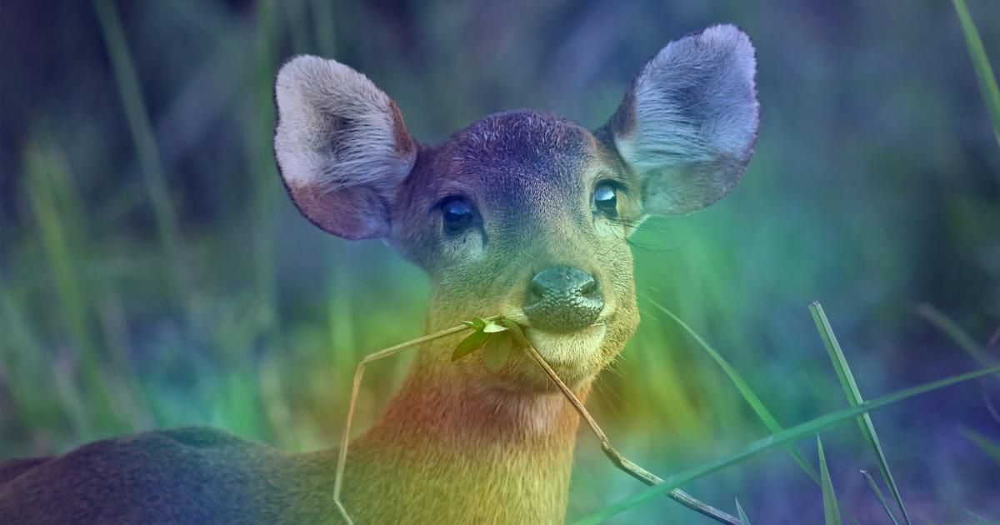

In [32]:
grad_cam_img_path = 'dataset/train/deer/indian_hog_deer5.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

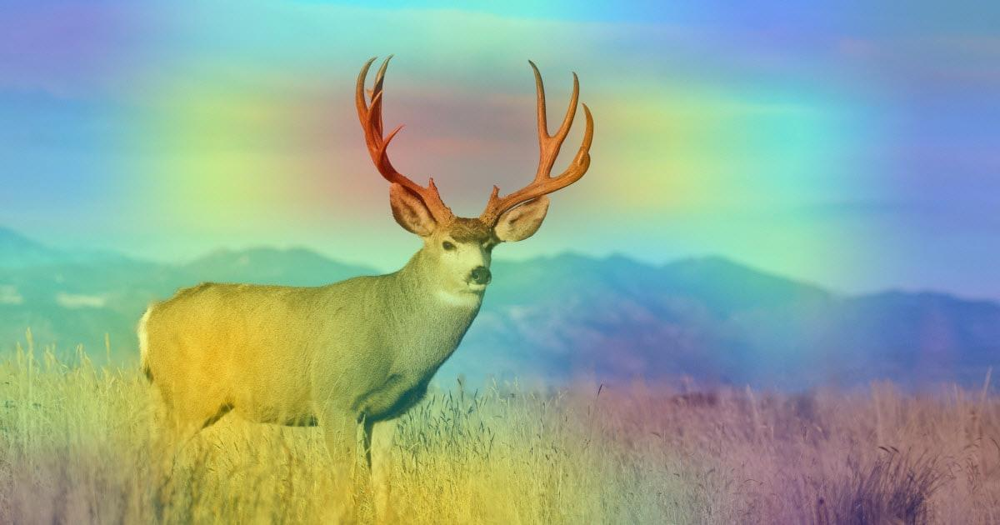

In [33]:
grad_cam_img_path = 'dataset/train/deer/mule_deer4.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

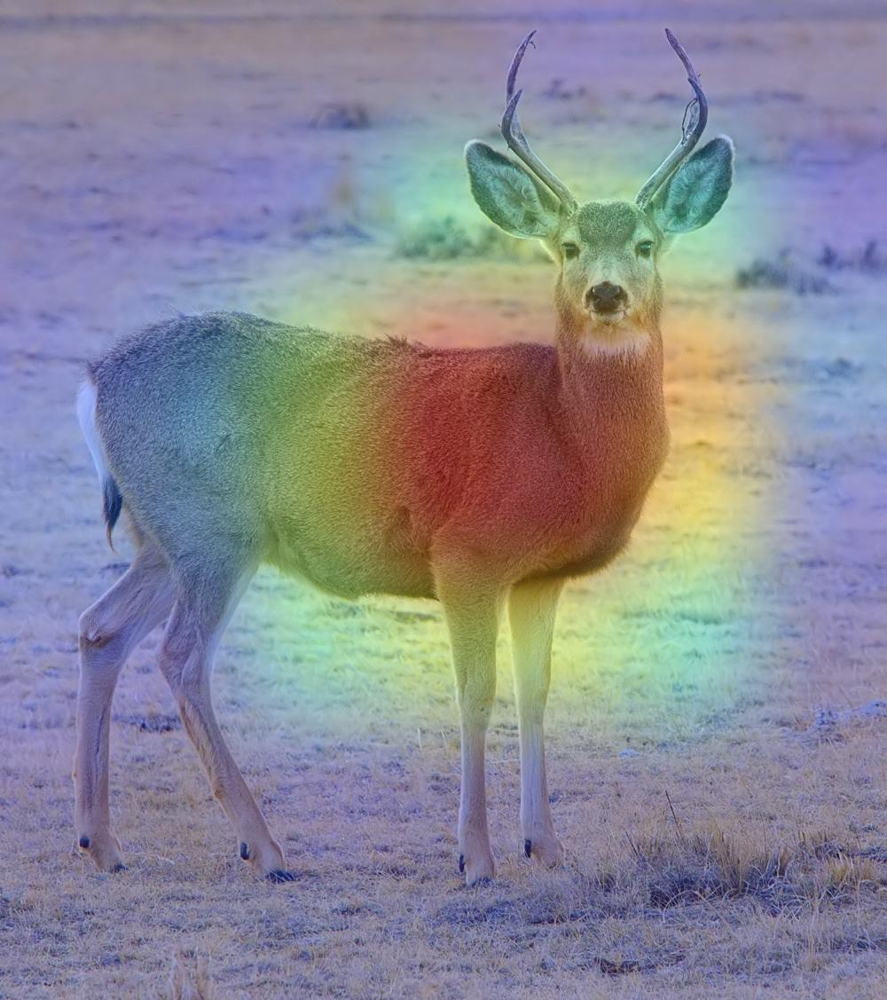

In [34]:
grad_cam_img_path = 'dataset/train/deer/mule_deer10.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

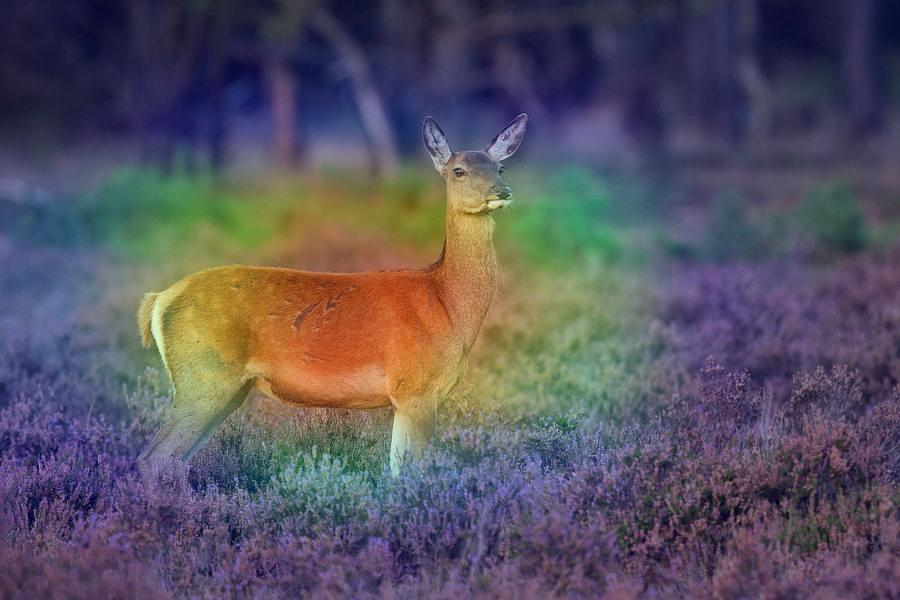

In [35]:
grad_cam_img_path = 'dataset/train/deer/red_deer_00001.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

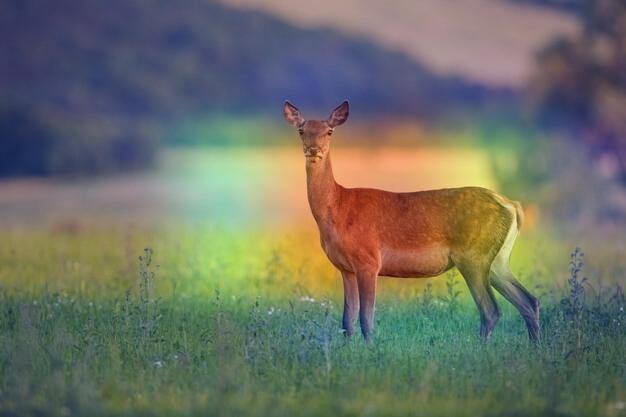

In [36]:
grad_cam_img_path = 'dataset/train/deer/red_deer_00018.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

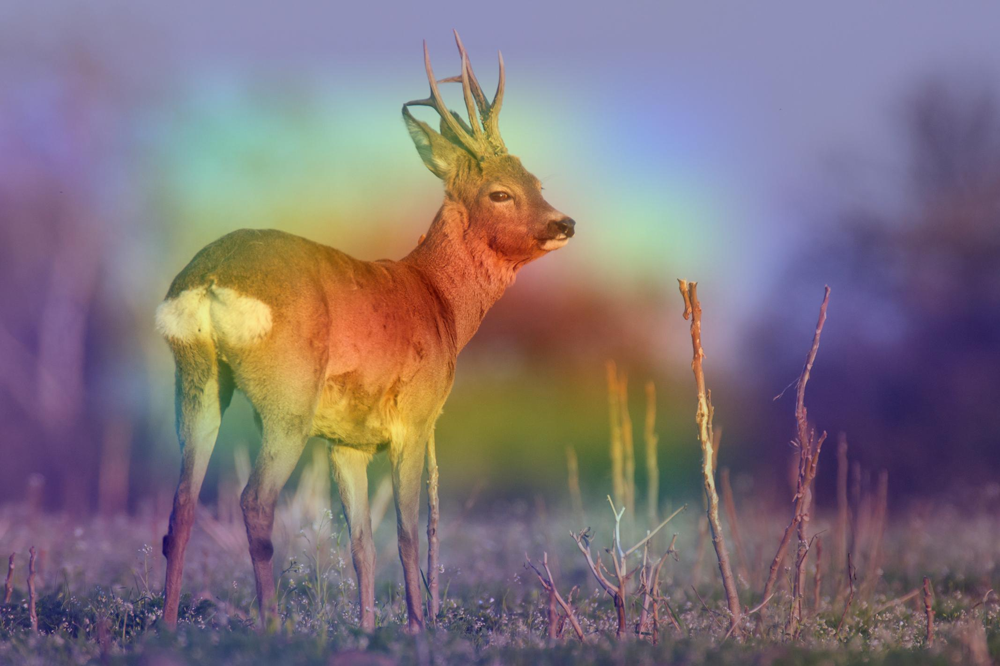

In [37]:
grad_cam_img_path = 'dataset/train/deer/roe_deer_2.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

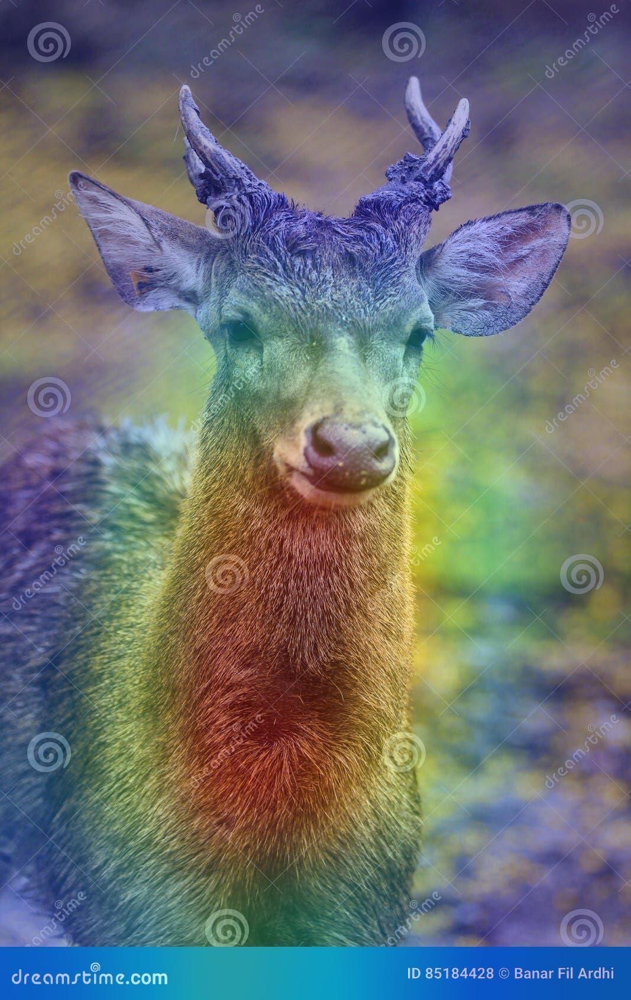

In [38]:
grad_cam_img_path = 'dataset/train/deer/rusa_00018.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

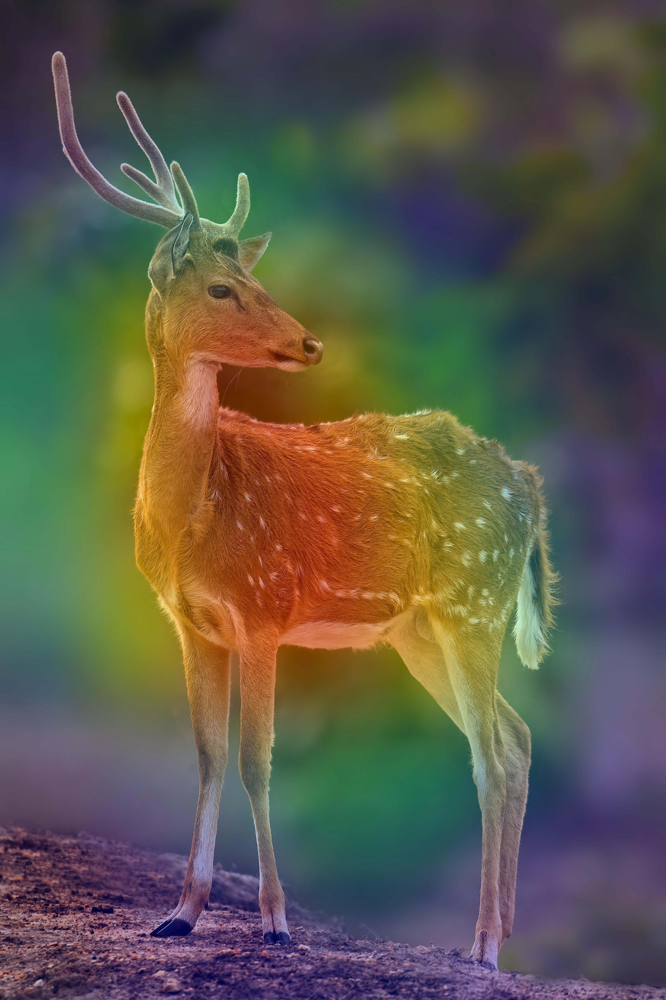

In [39]:
grad_cam_img_path = 'dataset/train/deer/sika_deer_00001.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

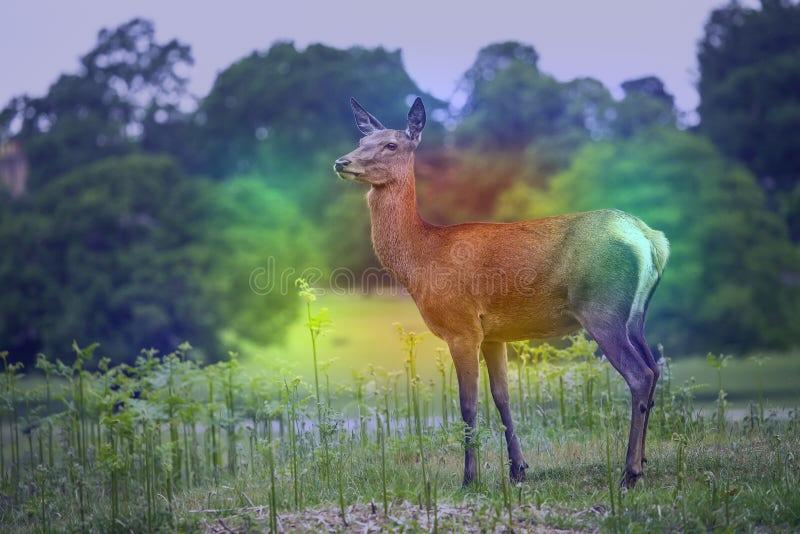

In [40]:
grad_cam_img_path = 'dataset/train/deer/sika_deer_00026.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

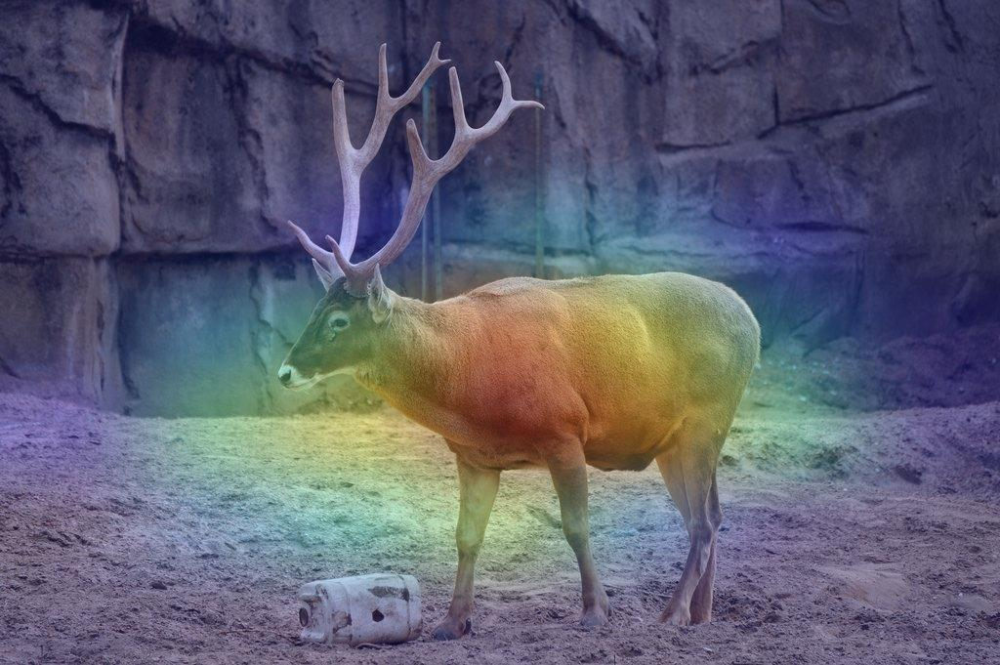

In [41]:
grad_cam_img_path = 'dataset/train/deer/thorold_deer_1.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

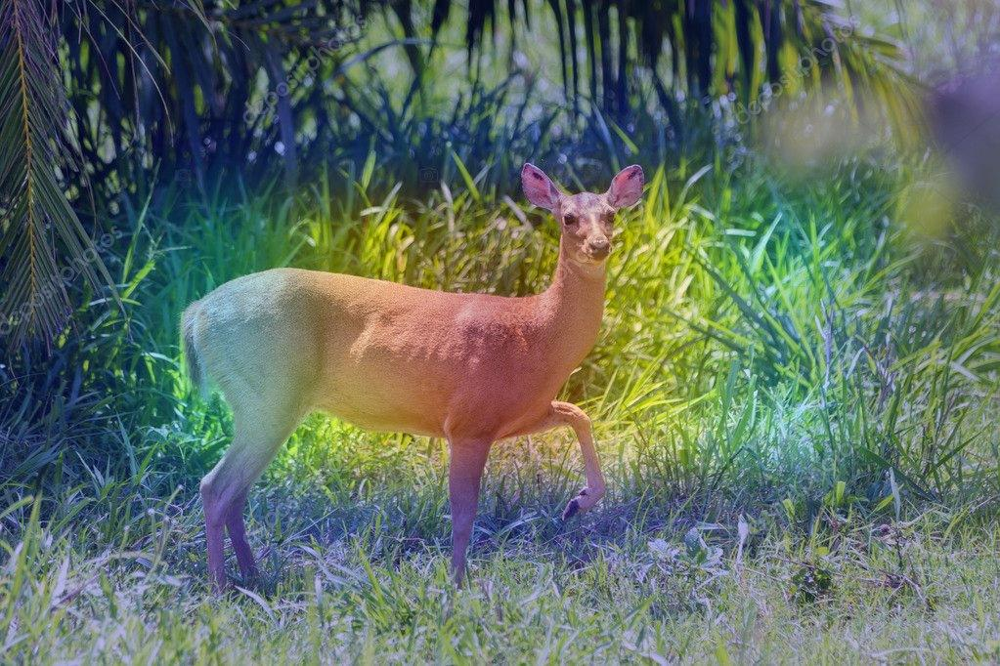

In [42]:
grad_cam_img_path = 'dataset/train/deer/white_tailed_deer_00006.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

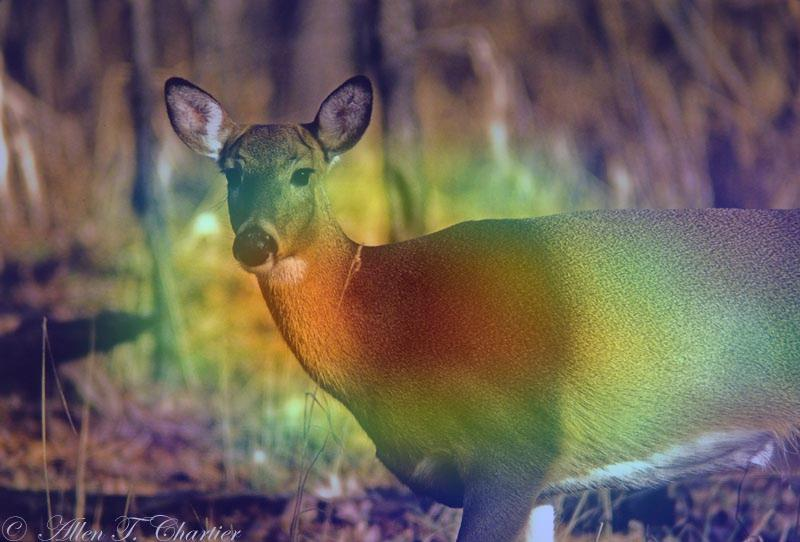

In [44]:
grad_cam_img_path = 'dataset/train/deer/white_tailed_deer_00013.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

# Caribou

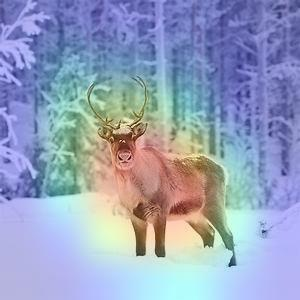

In [45]:
grad_cam_img_path = 'dataset/train/caribou/Female_Caribou68.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

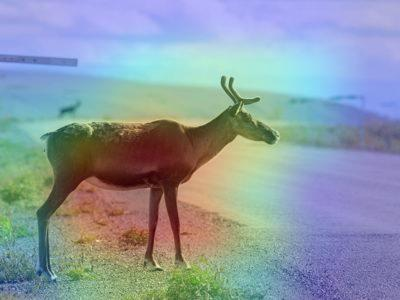

In [46]:
grad_cam_img_path = 'dataset/train/caribou/Female_Caribou96.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

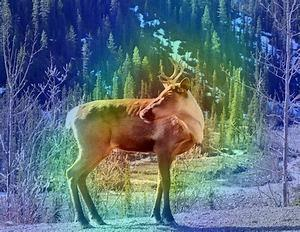

In [47]:
grad_cam_img_path = 'dataset/train/caribou/Female_Caribou9.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

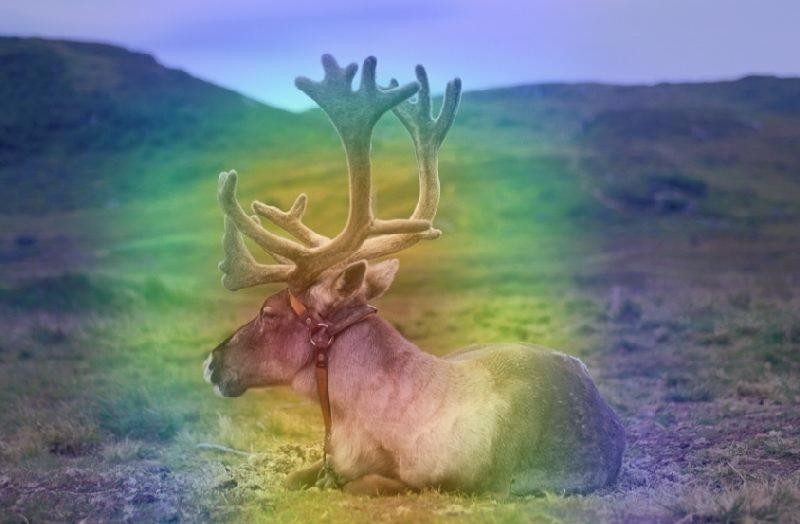

In [48]:
grad_cam_img_path = 'dataset/train/caribou/Male_Caribou58.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

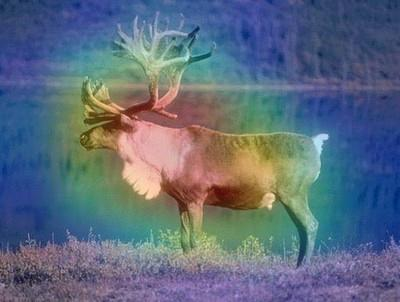

In [49]:
grad_cam_img_path = 'dataset/train/caribou/Male_Caribou66.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

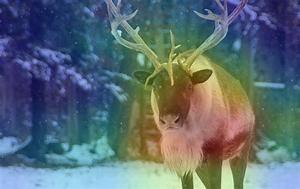

In [50]:
grad_cam_img_path = 'dataset/train/caribou/Male_Caribou83.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

# Elk

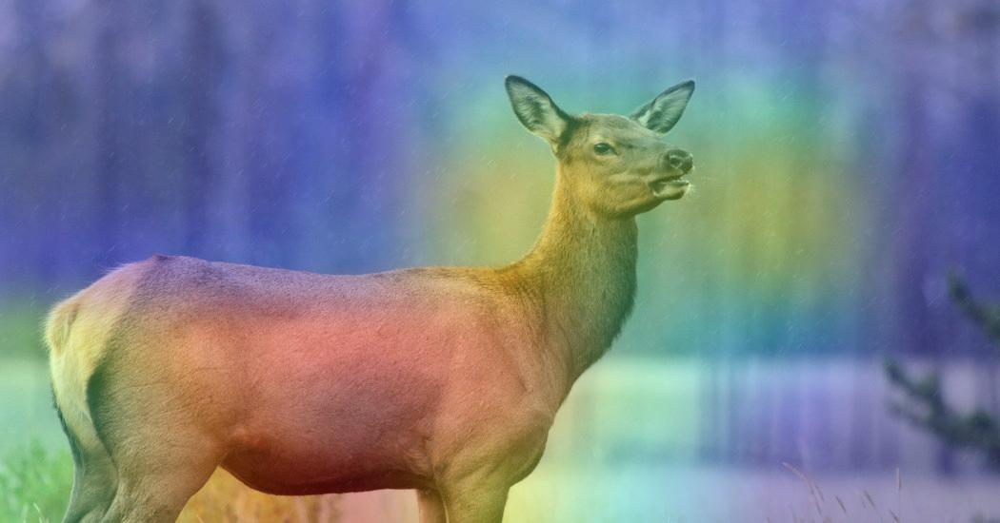

In [51]:
grad_cam_img_path = 'dataset/train/elk/EDF2.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

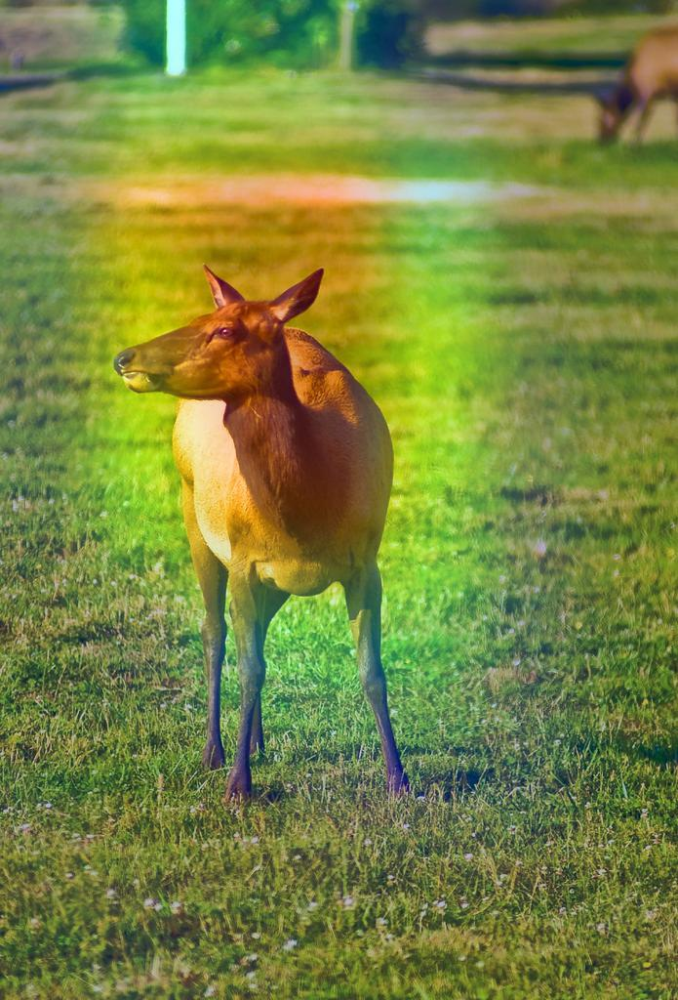

In [52]:
grad_cam_img_path = 'dataset/train/elk/EDF39.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

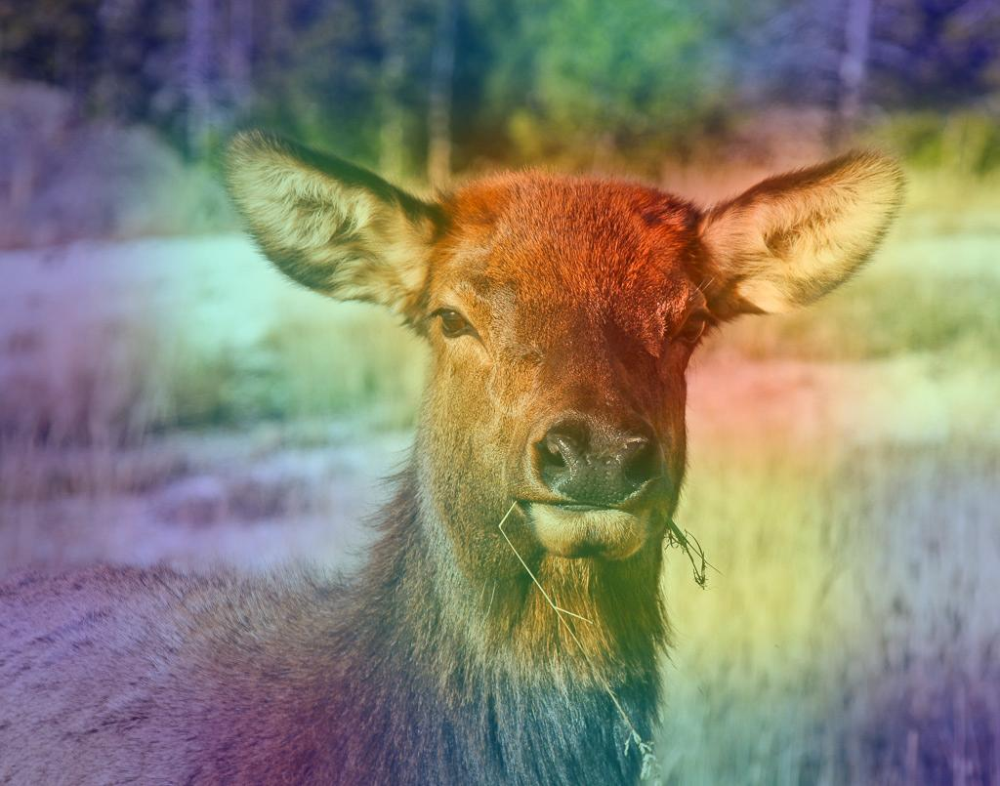

In [54]:
grad_cam_img_path = 'dataset/train/elk/EDF55.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

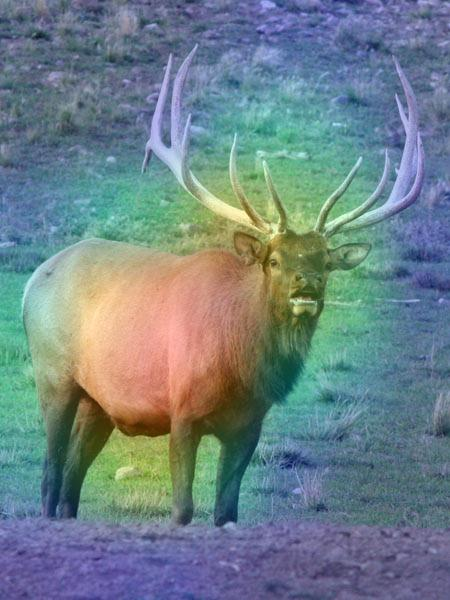

In [55]:
grad_cam_img_path = 'dataset/train/elk/EDM55.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

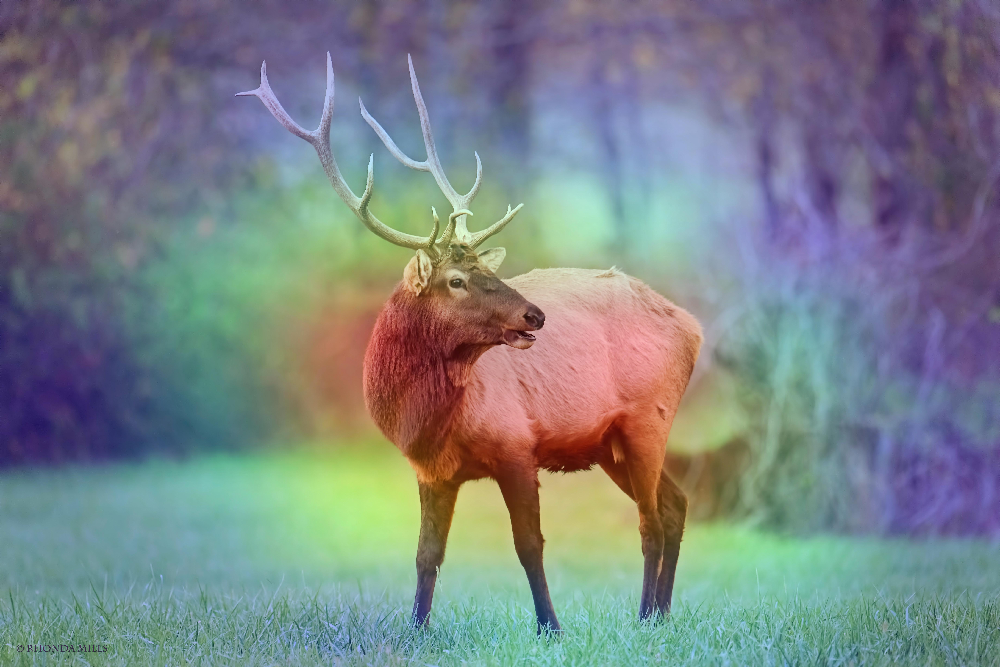

In [56]:
grad_cam_img_path = 'dataset/train/elk/EDM18.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

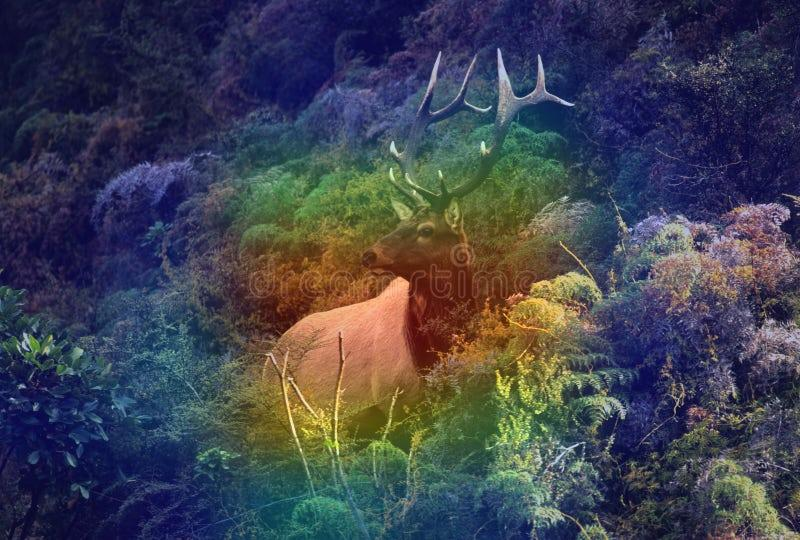

In [57]:
grad_cam_img_path = 'dataset/train/elk/EDM80.jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

# Moose

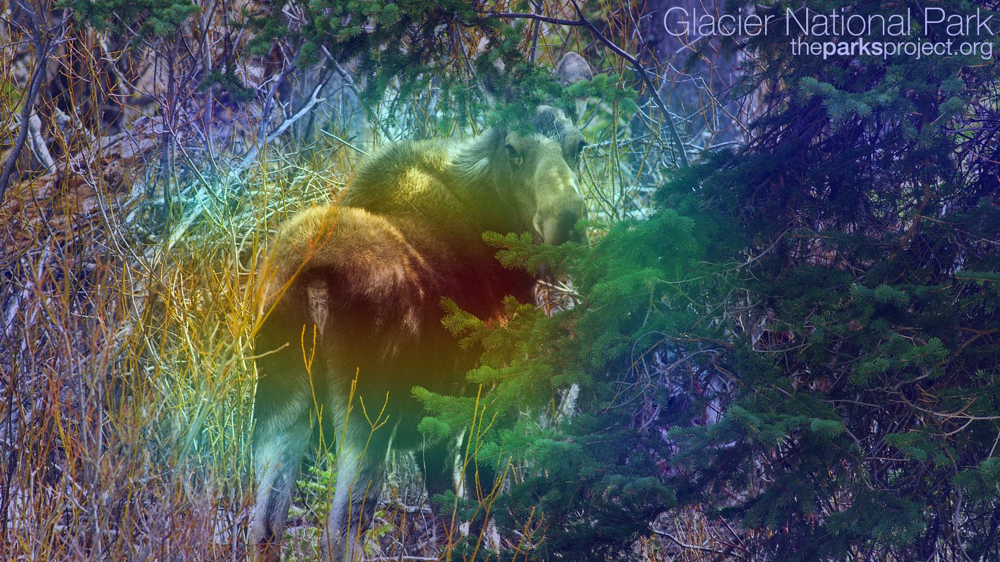

In [58]:
grad_cam_img_path = 'dataset/train/moose/female_moose (6).jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

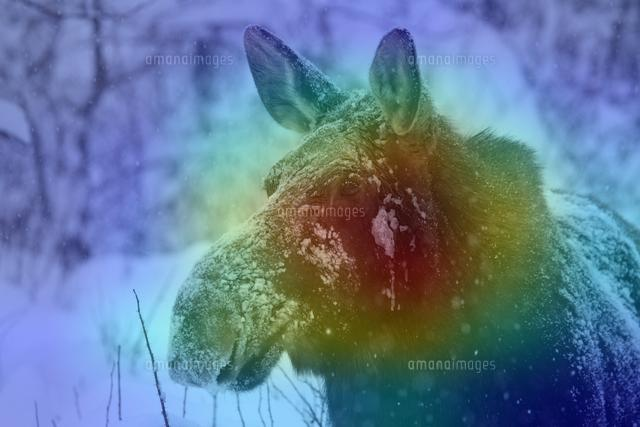

In [59]:
grad_cam_img_path = 'dataset/train/moose/female_moose (19).jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

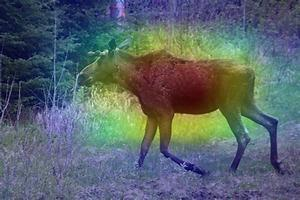

In [62]:
grad_cam_img_path = 'dataset/train/moose/female_moose (86).jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

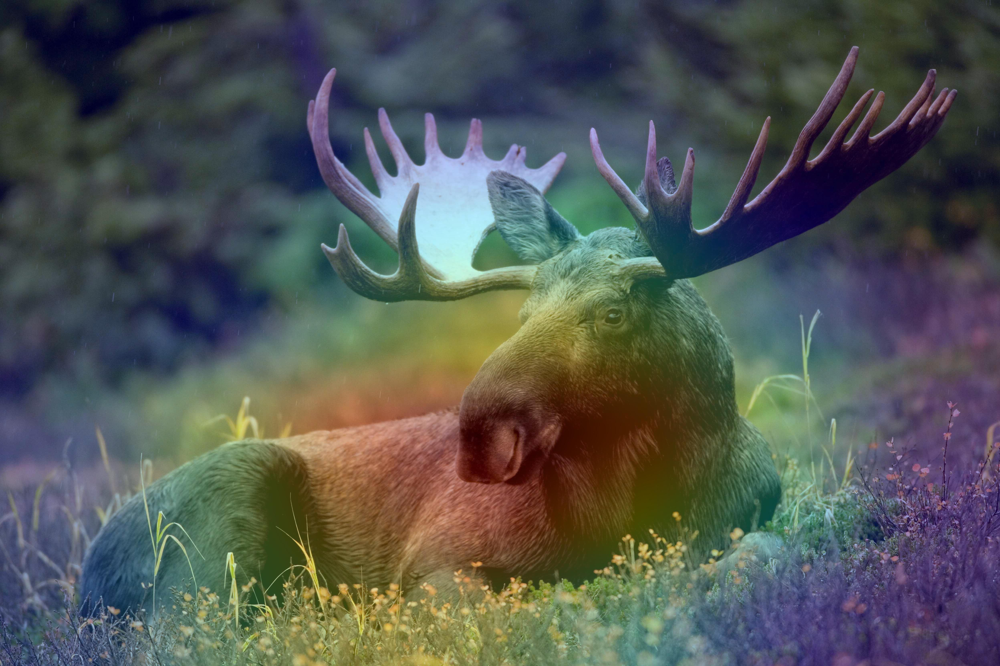

In [63]:
grad_cam_img_path = 'dataset/train/moose/male_moose (5).jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

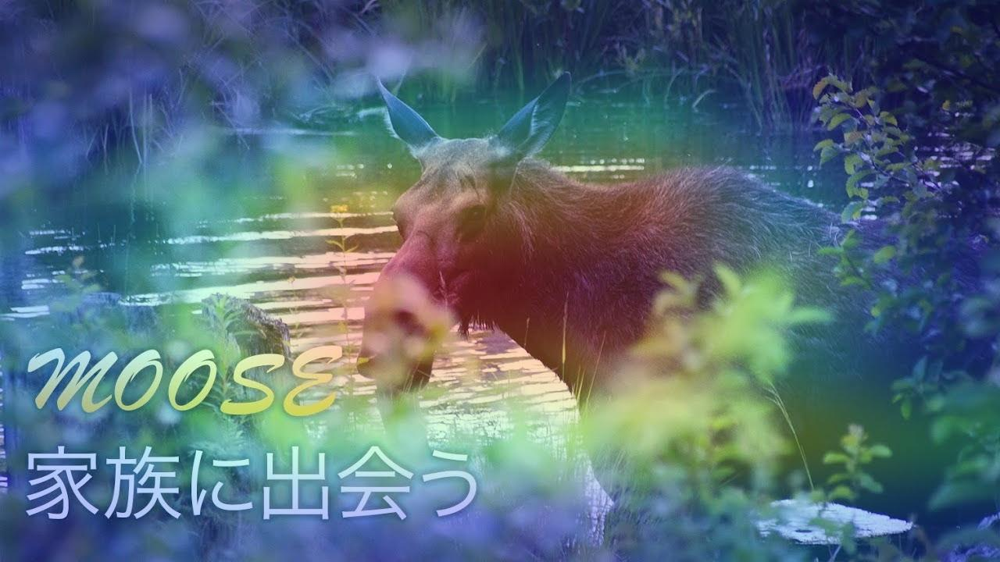

In [64]:
grad_cam_img_path = 'dataset/train/moose/male_moose (35).jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)

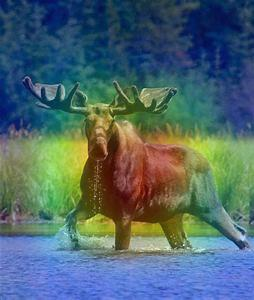

In [66]:
grad_cam_img_path = 'dataset/train/moose/male_moose (65).jpg'
img = get_img_array(grad_cam_img_path,size=(IMG_HEIGHT,IMG_WIDTH))
heatmap = make_gradcam_heatmap(img, loaded_model, last_conv_layer_name)
save_and_display_gradcam(grad_cam_img_path, heatmap)